# Exploring the Data
The global film industry is projected to make $50 billion in global box office revenue by 2020 (<https://www.statista.com/topics/964/film/>). With so much money at stake, film studios must make informed decisions regarding which movies are worth the investment. Some movies are huge hits (e.g., Avatar) where record breaking budgets are rewarded with equally record breaking worldwide box office revenue. On the other hand, a movies can "flop" at the box office -- resulting in a loss of millions of dollars for the studios. 

Once a film is released, a studio's financial fate is at the mercy of the viewing public. Long before a single cent of revenue is earned, however, film studios have already spent and/or under contract to spend a great deal of money. In the life of film, one could say the time of conception is when the studio executives greenlight a project after hearing the pitch. This can be considered the critical point for a studio since it determines if and how much money it is willing to invest. 

How is a studio to know if a film is worth the investment at the time it is pitched? There are several variables already defined  when a film is pitched including director,  writer, lead actors, language, estimated runtime, and estimated release date. The question then is: what are the characteristics of succcessful film?  

### Importing Data
Movie data was obtained from Kaggle's TMDB dataset (https://www.kaggle.com/tmdb/tmdb-movie-metadata). The data was cleaned with the `cleaned_data.py` script. The `import_clean_csv` method from the `import_data.py` module is used to import the cleaned TMDB data

In [1]:
import os
import importlib.util
import pandas as pd
import numpy as np
import sys

current_file_path = os.path.abspath(os.path.join("__file__" ,"../.."))
thinkstats_path = os.path.abspath(os.path.join(current_file_path, 'src', 'tools'))
sys.path.append(os.path.abspath(os.path.join(thinkstats_path)))
import thinkstats2, thinkplot

import_data_path = os.path.join(current_file_path,'src','data')

spec = importlib.util.spec_from_file_location("import_clean_csv", os.path.join(import_data_path,"import_clean_data.py"))
import_data = importlib.util.module_from_spec(spec)
spec.loader.exec_module(import_data)

data = import_data.import_clean_csv()

### Importing Packages for Visualizations

In [2]:
#Following Python packages are necessary for data visualiations below

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import cufflinks as cf

init_notebook_mode(connected=True)
cf.go_offline()

In [3]:
#function for creating interactive plots of dataframes

def get_plotly(xdata, ydata=[], dfname=[], xlabel='', ylabel="", text = 'title',plot_type='scatter'):
    if plot_type == 'scatter':
        if len(xdata) != len(ydata):
            return None


        data = [{'x': x, 'y':y, 'mode': 'markers', 'text':x.reset_index()[text], 'name': dfname} 
                for x, y, dfname in zip(xdata, ydata, dfname)]

        layout = go.Layout(
            xaxis=dict(
                title=xlabel,
                titlefont=dict(
                    family='Courier New, monospace',
                    size=18,
                    color='#7f7f7f'
                )
            ),
            yaxis=dict(
                title=ylabel,
                titlefont=dict(
                    family='Courier New, monospace',
                    size=18,
                    color='#7f7f7f'
                )
            )
        )
        fig = go.Figure(data=data, layout=layout)
        iplot(fig)
    elif plot_type == 'hist':
        # distribution of Hits and Flops by budget

        data = [go.Histogram(x=x,
                        name=dfname) for x, dfname in zip(xdata,dfname)]

        layout = go.Layout(xaxis=dict(title=xlabel),
                        yaxis=dict(title=ylabel))
        fig = go.Figure(data=data, layout=layout)

        iplot(fig)


In [4]:
# create dataframes from cleaned data
movies = data['tmdb_movie_main'].set_index(['movie_id', 'title'])
movies['release_date'] = pd.to_datetime(movies['release_date'])
cast = data['tmdb_cast_credit'].set_index(['movie_id', 'title'])
crew = data['tmdb_crew_credit'].set_index(['movie_id', 'title'])
genres = data['tmdb_movie_genres'].set_index(['movie_id', 'title'])
keywords = data['tmdb_movie_keywords'].set_index(['movie_id', 'title'])
prod_company = data['tmdb_movie_production_companies'].set_index(['movie_id', 'title'])
prod_countries = data['tmdb_movie_production_countries'].set_index(['movie_id', 'title'])
languages = data['tmdb_movie_spoken_languages'].set_index(['movie_id', 'title'])

# Successful Movies
A successful movie, is defined to be any movie that at least breaks even (i.e., `net >= 0`). Successful movies are contained in the `Hits` dataframe, while the financially unsuccessful movies are contained in `Flops`. To quantify the success of a movie, we will calculate net revenue (`net`) and the ratio of net revenue and budget (`net_pct`). 

In [5]:
movies['net'] = movies.revenue - movies.budget
movies['net_pct'] = movies.revenue.divide(movies.budget) - 1

key_metrics = ['budget', 'revenue','net', 'net_pct','runtime', 'vote_average', 'vote_count','popularity', 'release_date']
Total = movies[key_metrics]
Hits = Total[Total.net >= 0]
Flops = Total[Total.net < 0]

Total.name = "Total"
Hits.name = "Hits"
Flops.name = "Fops"

# The Spread
It is clear that there is a vast spread regarding the amount of revenue movies bring. In terms of `net_pct`, the most successful movie of all-time brought +438% more revenue than what is cost to make. Conversely, the least successful film in terms of `net_pct` made almost no revenue at all (`net_pct = -99%`). The average returns for all movies in the dataset, however, is just under +4%. 

In [6]:
movies[['net','net_pct']].describe()

,net,net_pct
count,4.357000e+03,4357.000000
mean,6.082761e+07,3.930984
std,1.407965e+08,20.343577
min,-1.657101e+08,-0.999875
25%,-2.267642e+06,-0.318098
50%,1.124116e+07,0.876884
75%,6.571488e+07,2.853306
max,2.550965e+09,438.616585


In [7]:
print(movies.nlargest(1,'net_pct')[['budget', 'revenue', 'net', 'net_pct']])
print('\n')
print(movies.nsmallest(1,'net_pct')[['budget', 'revenue', 'net', 'net_pct']])

                         budget     revenue         net     net_pct
movie_id title                                                     
9372     Super Size Me  65000.0  28575078.0  28510078.0  438.616585


                              budget  revenue        net   net_pct
movie_id title                                                    
41009    Perrier’s Bounty  6600000.0    828.0 -6599172.0 -0.999875


# Overview
There doesn't seem to be any strong trends between the various movie metrics. It is interesting to note that net revenuve % (`net_pct`) does not increase with budget. The revenue and net revenue do seem to have a positive correlation with budget and vote metrics. There are also appears to be an optimal movie runtime of around 100 min for high values of `net` and `net_pct`.

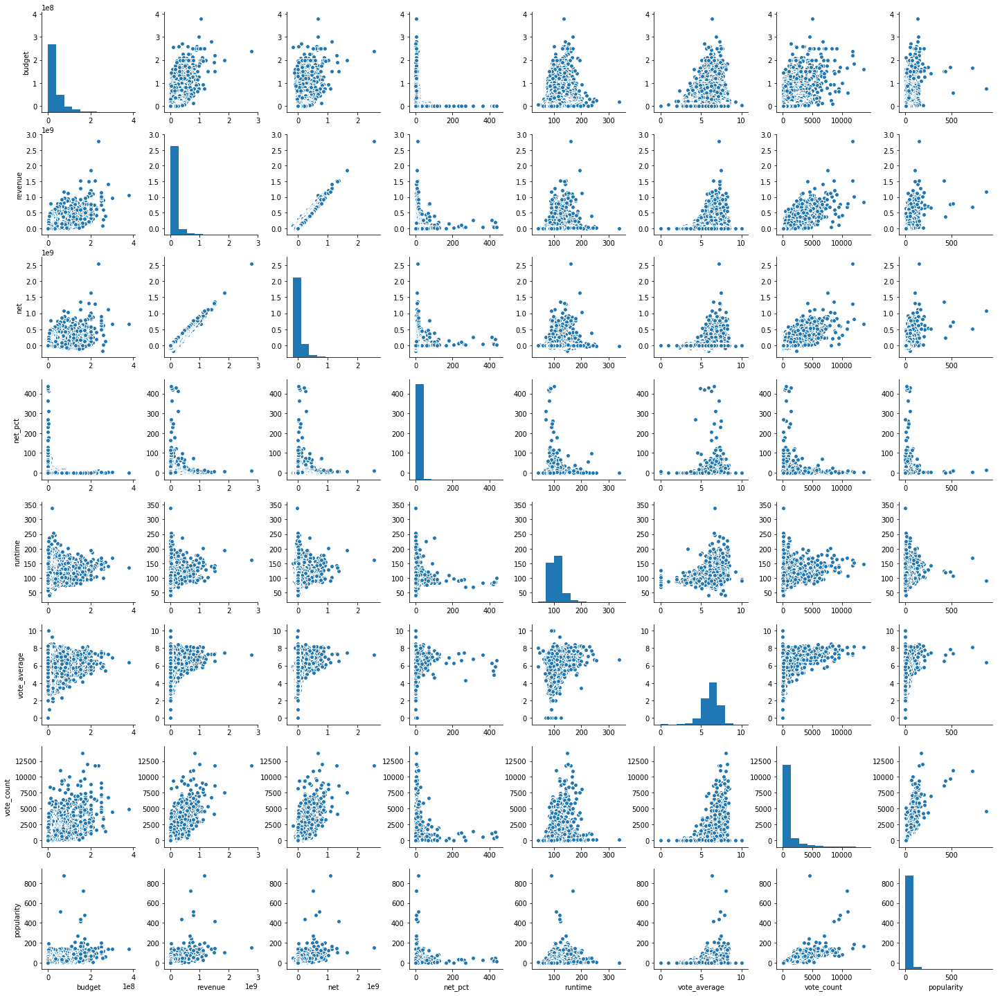

In [8]:
sns.pairplot(Total)
plt.show()

# Big Budget = Big Returns?
When viewing movies sorted by `budget`, `revenue`, and `net`; there is a consistency among the top movies based on those metrics. Meaning that the movies with the highest budget often generate the most revenue. When sorting by `net_pct`, however, the list of movies is very different. In fact, it's mostly the small budget films that make the most in terms of `net_pct`.

In [9]:
movies.nlargest(5,'budget')[['budget', 'revenue', 'net','net_pct']]

,,budget,revenue,net,net_pct
movie_id,title,,,,
1865,Pirates of the Caribbean: On Stranger Tides,380000000.0,1.045714e+09,6.657138e+08,1.751878
285,Pirates of the Caribbean: At World's End,300000000.0,9.610000e+08,6.610000e+08,2.203333
99861,Avengers: Age of Ultron,280000000.0,1.405404e+09,1.125404e+09,4.019299
1452,Superman Returns,270000000.0,3.910812e+08,1.210812e+08,0.448449
49529,John Carter,260000000.0,2.841391e+08,2.413910e+07,0.092843


In [10]:
movies.nlargest(5,'revenue')[['budget', 'revenue', 'net','net_pct']]

,,budget,revenue,net,net_pct
movie_id,title,,,,
19995,Avatar,237000000.0,2.787965e+09,2.550965e+09,10.763566
597,Titanic,200000000.0,1.845034e+09,1.645034e+09,8.225171
24428,The Avengers,220000000.0,1.519558e+09,1.299558e+09,5.907081
135397,Jurassic World,150000000.0,1.513529e+09,1.363529e+09,9.090192
168259,Furious 7,190000000.0,1.506249e+09,1.316249e+09,6.927628


In [11]:
movies.nlargest(5,'net')[['budget', 'revenue', 'net','net_pct']]

,,budget,revenue,net,net_pct
movie_id,title,,,,
19995,Avatar,237000000.0,2.787965e+09,2.550965e+09,10.763566
597,Titanic,200000000.0,1.845034e+09,1.645034e+09,8.225171
135397,Jurassic World,150000000.0,1.513529e+09,1.363529e+09,9.090192
168259,Furious 7,190000000.0,1.506249e+09,1.316249e+09,6.927628
24428,The Avengers,220000000.0,1.519558e+09,1.299558e+09,5.907081


In [12]:
movies.nlargest(5,'net_pct')[['budget', 'revenue', 'net','net_pct']]

,,budget,revenue,net,net_pct
movie_id,title,,,,
9372,Super Size Me,65000.0,28575078.0,28510078.0,438.616585
23827,Paranormal Activity,450000.0,194183034.0,193733034.0,430.517853
299245,The Gallows,100000.0,42664410.0,42564410.0,425.644100
83,Open Water,130000.0,54667954.0,54537954.0,419.522723
2667,The Blair Witch Project,600000.0,248300000.0,247700000.0,412.833333


# Optimizing Budget
A plot of `budget` vs `net` does not show a strong correlation between budget and net revenue. The peak of the plot is for `Avatar`, which broke all records in its release and is a clear outlier. In general, the net revenue seems to plateau with increases in budget.

In [13]:
get_plotly([Total.budget], [Total.net], ['All Movies'], 'Budget', 'Net')

In [14]:
get_plotly([Total.budget], [Total.net_pct], ['Total'], 'Budget', 'Net %')

In general, the lower budget films up to \$2.5M comprise most of all films made - for both hits and flops. Although, a clear majority of movies with budgets around \$152.5M and \$202.5M are hits. 

In [15]:
# distribution of Hits and Flops by budget

trace_hits = go.Histogram(x=Hits.budget,
                name='Hits',
                marker=dict(color='blue'))

trace_flops = go.Histogram(x=Flops.budget,
                name='Flops',
                marker=dict(color='red'))

data = [trace_hits, trace_flops]
layout = go.Layout(xaxis=dict(title='Budget'),
                yaxis=dict(title='# of Movies'))
fig = go.Figure(data=data, layout=layout)

iplot(fig)

# Budgets Through the Years
Studios have steadily been increasing the budget for movies. The net revenue have also increased throughout the years. The losses from movies that have flopped, however, have not been increasing in the same manner. This could mean that studios have been getting smarter with their investments with time. Although, the net revenue % has not increased as steadily with time.

In [16]:
get_plotly([Hits.release_date.dt.year, Flops.release_date.dt.year], [Hits.budget, Flops.budget], 
           ['Hits', 'Flops'], 'Year', 'Budget')

In [17]:
get_plotly([Hits.release_date.dt.year, Flops.release_date.dt.year], [Hits.net, Flops.net], 
           ['Hits', 'Flops'], 'Year', 'Net Revenue')

In [18]:
get_plotly([Hits.release_date.dt.year, Flops.release_date.dt.year], [Hits.net_pct, Flops.net_pct], 
           ['Hits', 'Flops'], 'Year', 'Net Revenue %')

# Does a Movie's Success Depend on Release Date?
Following plots show that movies released in April, June and November typically perform better than other months in terms of net revenue %. In terms of number of successful movies made, however, the most successful movies have September and December release dates. When looking at a daily basis, movies released at the 1st of the month or towards the end of the month perform much better. This most likely due to the fact that most major holidays occur at the beginning (e.g., July 4th, Labor Day) and end (e.g., Thanksgiving, Christmas) of the month.

In [19]:
get_plotly([Hits.release_date.dt.month, Flops.release_date.dt.month], [Hits.net, Flops.net], 
           ['Hits', 'Flops'], 'Month (1 = Jan, 12 = Dec)', 'Net')

In [20]:
get_plotly(xdata=[Hits.release_date.dt.month, Flops.release_date.dt.month], dfname=['Hits','Flops'], xlabel='Month (1=Jan, 12=Dec)', plot_type='hist')

In [21]:
get_plotly([Hits.release_date.dt.day, Flops.release_date.dt.day], [Hits.net, Flops.net], 
           ['Hits', 'Flops'], 'Day of Month)', 'Net')

In [22]:
get_plotly(xdata=[Hits.release_date.dt.day, Flops.release_date.dt.day], dfname=['Hits','Flops'], xlabel='Month (1=Jan, 12=Dec)', plot_type='hist')

## Track Records for Directors

It is difficult for directors to have a consistent track record of financially successful movies. The more movies a director makes, the lower the `net_pct`. First time directors (i.e., `count = 1`) are responsible for the most financially successful movies, but more often than not they are responsible for flops. Steven Spielberg has made the most movies out of all directors and also holds the title for most financially successful movies made. His rate of return (i.e., `net_pct`), however, is on the lower end of spectrum compared to less experienced directors.

In [23]:
Hits_Director = Hits.merge(right=crew[crew.job == 'Director'], left_index=True, right_index=True)
Flops_Director = Flops.merge(right=crew[crew.job == 'Director'], left_index=True, right_index=True)
Hits_Director_Net_Pct = Hits_Director.groupby('name').net_pct.agg(['mean', 'count']).sort_values(by='mean', ascending=False)
Flops_Director_Net_Pct = Flops_Director.groupby('name').net_pct.agg(['mean', 'count']).sort_values(by='mean', ascending=False)

Hits_Director_Net_Pct.name = 'Hits_Director_Net_Pct'
Flops_Director_Net_Pct.name = 'Flops_Director_Net_Pct'


In [24]:
get_plotly(xdata=[Hits_Director_Net_Pct['count'], Flops_Director_Net_Pct['count']], 
           ydata=[Hits_Director_Net_Pct['mean'], Flops_Director_Net_Pct['mean']], 
           dfname=['Hits','Flops'], xlabel='count', ylabel='Avg Net %', text='name')

In [25]:
get_plotly(xdata=[Hits_Director_Net_Pct['count'], Flops_Director_Net_Pct['count']],dfname=['Hits','Flops'], 
           xlabel='Director', ylabel='# of Movies', plot_type='hist')

In [26]:
get_plotly(xdata=[Hits_Director.name, Flops_Director.name],dfname=['Hits','Flops'], 
           xlabel='Director', ylabel='# of Movies', plot_type='hist')

In [27]:
top_cast = cast[cast.order < 4]

Hits_Top_Cast = Hits.merge(right=top_cast, left_index=True, right_index=True)
Flops_Top_Cast = Flops.merge(right=top_cast, left_index=True, right_index=True)
Hits_Top_Cast_Net_Pct = Hits_Top_Cast.groupby('name').net_pct.agg(['mean', 'count']).sort_values(by='mean', ascending=False)
Flops_Top_Cast_Net_Pct = Flops_Top_Cast.groupby('name').net.agg(['mean', 'count']).sort_values(by='mean', ascending=False)

Hits_Top_Cast_Net_Pct.name = 'Hits'
Flops_Top_Cast_Net_Pct.name = 'Flops'

Hits_Top_Cast_Net_Pct.reset_index(inplace=True)
Flops_Top_Cast_Net_Pct.reset_index(inplace=True)

In [28]:
Hits_Actors = Hits_Top_Cast_Net_Pct[Hits_Top_Cast_Net_Pct['count'] > 2]

trace0 = go.Scatter(
    x = Hits_Actors['count'],
    y = Hits_Actors['mean'],
    name = 'Hits',
    mode = 'markers',
    text = Hits_Actors['name'],
    marker = dict(
        size = Hits_Actors['count'],
        color = 'rgba(152, 0, 0, .8)',
        line = dict(
            width = 2,
            color = 'rgb(0, 0, 0)'
        )
    )
)

data = [trace0]

layout = go.Layout(title = 'Styled Scatter',
              yaxis = dict(title='mean'),
              xaxis = dict(title='count')
             )


fig = dict(data=data, layout=layout)
iplot(data)
                                             

In [29]:
Hits_Actors = Hits_Top_Cast_Net_Pct.nlargest(20,'mean')
data = [go.Bar(
            x=Hits_Actors['name'], 
            y=Hits_Actors['mean']
        )]

iplot(data)
                                             

In [30]:
prod_company.head()

id  \
movie_id title                                           
19995    Avatar                                    289   
         Avatar                                    306   
         Avatar                                    444   
         Avatar                                    574   
285      Pirates of the Caribbean: At World's End    2   

                                                                                     name  
movie_id title                                                                             
19995    Avatar                                                   Ingenious Film Partners  
         Avatar                                    Twentieth Century Fox Film Corporation  
         Avatar                                                        Dune Entertainment  
         Avatar                                                  Lightstorm Entertainment  
285      Pirates of the Caribbean: At World's End                    Walt Disney Pictures

In [31]:
df = Hits
df2 = df.merge(right=prod_company, left_index=True, right_index=True, how='inner')
df3 = df2.groupby('name').net_pct.agg(['count', 'mean']).sort_values(by='mean', ascending=False).reset_index()
df3.set_index('name', inplace=True)
df3.name = 'Production Companies'
df3.head()

,count,mean
name,,
Kathbur Pictures,1,438.616585
Tremendum Pictures,1,425.644100
Plunge Pictures LLC,1,419.522723
Vortex,1,362.047059
Image Ten,1,262.157895
